Yosha op het Veld, Kasper Walraven, Felix Douven

# Initialization

load all needed libraries and functions, 
check the previous tutorial how to correctly load keras and other modules

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2
import keras
from tqdm import tqdm
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D
from tensorflow.keras.models import Sequential

importing the libraries used in the code.

# Load dataset & Plot a subset

load your dataset and show a plot of the subset of your data



Now processing crab


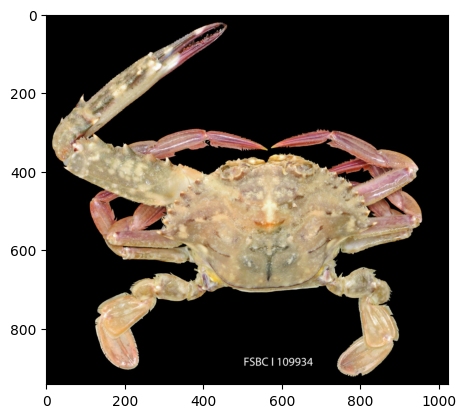

Now processing duck


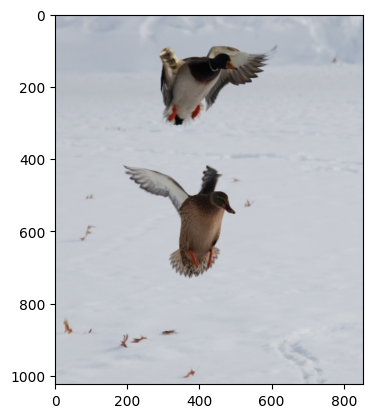

Now processing hedgehog


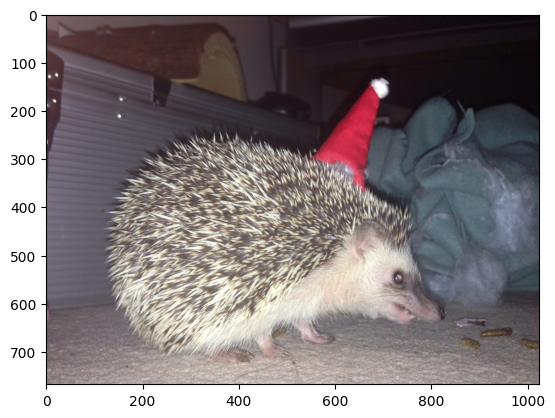

Now processing panda


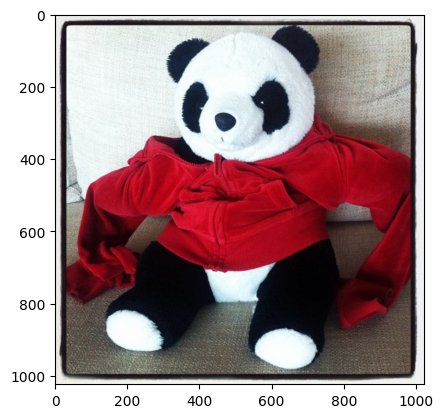

Now processing penguin


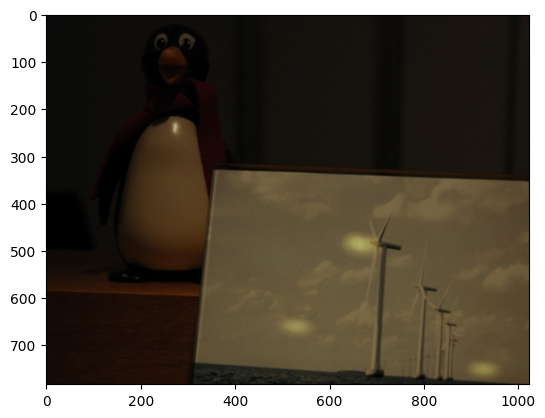

Now processing raccoon


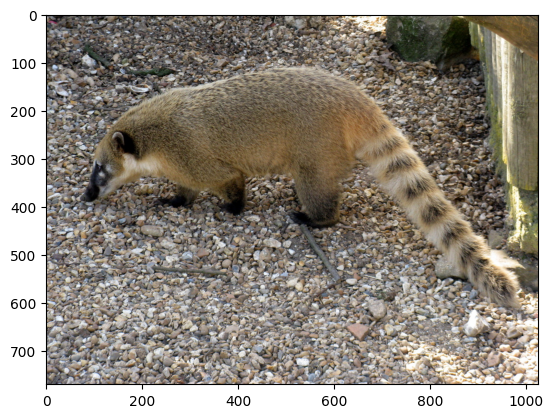

In [40]:
#felix
#DATADIR = "C:/Users/felix/Office 365 Fontys/AIS zooi - General/Ass2C/pictures/train"
#Yosha
#DATADIR = "C:/Users/yosha19/OneDrive - Office 365 Fontys/General/Ass2C/pictures/train"
#kasper
DATADIR = "C:/Users/mobie/OneDrive - Office 365 Fontys/General - AIS zooi/Ass2C/pictures/train"

CATEGORIES = ["crab", "duck", "hedgehog", "panda", "penguin", "raccoon"]


for category in CATEGORIES:  
    path = os.path.join(DATADIR,category)  
    for img in os.listdir(path):  
        img_arrayBGR = cv2.imread(os.path.join(path,img))  # convert to array
    #show first picture of every category
    print("Now processing", category)
    plt.imshow(img_arrayBGR[...,::-1])  
    plt.show()
    

importing the images and plotting the last picture of every category.

# Prepare Data

pre-process your raw input data... rescale... normalize....

In [41]:
img_size = 224
X_img = []
Y_class = []
#test_data = []

def create_data():
    for category in CATEGORIES: 

        path = os.path.join(DATADIR,category)  
        class_num = CATEGORIES.index(category)  

        for img in tqdm(os.listdir(path)):
            try:
                img_arrayBGR = cv2.imread(os.path.join(path,img))  # convert to array
                preprocessed_array = cv2.resize(img_arrayBGR, (img_size, img_size))  # resize to normalize data size
                preprocessed_array = np.expand_dims(preprocessed_array, axis=0)
                X_img.append(preprocessed_array)  # add img to array
                Y_class.append(class_num)     # add class to array
            except Exception as e:  # in the interest in keeping the output clean...
                print("Resizing not possible")
                plt.imshow(img_arrayBGR[...,::-1])  
                plt.show()
                
create_data()

#array to numpy array
X_img = np.asarray(X_img)
Y_class = np.asarray(Y_class)

#print(X_img, Y_class)
print("IMG shape = ",X_img.shape)
print("Class shape=",Y_class.shape)

#delete 1 object from array
new_X_img = X_img[:,0,:,:]

# create a new array with 360 rows and 6 columns, filled with zeros
new_Y_class = np.zeros((2184, 6))  
# copy the values from Y_class into new_Y_class
for i in range(len(Y_class)):
    new_Y_class[i, Y_class[i]] = 1


print("IMG shape = ",new_X_img.shape)
print("Class shape=",new_Y_class.shape)
print(new_X_img)
print(new_Y_class)

100%|██████████| 204/204 [00:02<00:00, 75.77it/s]


IMG shape =  (2184, 1, 224, 224, 3)
Class shape= (2184,)
IMG shape =  (2184, 224, 224, 3)
Class shape= (2184, 6)
[[[[ 15  14  18]
   [ 23  25  32]
   [ 20  20  26]
   ...
   [ 55  33  28]
   [ 52  32  27]
   [ 52  32  27]]

  [[ 16  15  17]
   [ 22  24  33]
   [ 19  21  29]
   ...
   [ 55  33  28]
   [ 52  32  27]
   [ 52  32  27]]

  [[ 18  18  19]
   [ 21  22  31]
   [ 20  22  30]
   ...
   [ 56  34  29]
   [ 55  33  28]
   [ 56  34  29]]

  ...

  [[ 23  42 100]
   [ 35  68 137]
   [ 33  62 141]
   ...
   [ 69  79  96]
   [ 65  73  90]
   [ 65  75  93]]

  [[ 24  46 115]
   [ 24  50 123]
   [ 30  60 138]
   ...
   [ 71  81  98]
   [ 69  79  97]
   [ 66  76  94]]

  [[ 19  55 129]
   [ 19  43 107]
   [ 24  41 114]
   ...
   [ 75  85 102]
   [ 72  84 102]
   [ 71  81  99]]]


 [[[ 31  65 106]
   [ 23  54 106]
   [ 16  50 100]
   ...
   [ 18  27  23]
   [ 10  19  16]
   [ 10  16  15]]

  [[ 42  80 108]
   [ 31  66 109]
   [ 23  56 110]
   ...
   [ 20  27  21]
   [ 12  19  16]
   [  9  

the images are converted from BGR to RGB, resized to 224*224, processed to fit in an array of the right shape. wich is then converted to a numpy array. this array then gets the same shape as the vgg16 model input by adding or removing columns.

## Define your Model

With Transfer learning you take a given network model withouth the last layers, you can take the suggested VGG-16 model as decribed on the given website and add the additional layers. 

**NOTE:**
That the Ouput layer should match your input dataset!



* How is your model constructed, how many trainable parameters does it have, and where are they located?

In [5]:
#make vgg16 untrainable
vgg16 = VGG16(weights = "imagenet", include_top = False, input_shape = (img_size, img_size, 3))
vgg16.trainable = False 

vgg16.summary()

#add vgg16 untrainable model & 3 new trainable layers
model = tf.keras.models.Sequential()
model.add(vgg16)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(6, activation=tf.nn.softmax))

model.summary()


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

a new model is created and the vgg16 model is added as a feature detection. after this a flattening layer, two fully connected layers and an output layer are added.

# Fit the Model

Fitting the model is the time consuming part, this depend on the complexity of the model and the amount of training data. With Transfer learning a lot of pre-trained parameters are now 'frozen', this will limit training time (or enables us to train more complex networks with the same processing performance, and so achieving better results)

* Which batch size and how many epochs give a good result?

In [6]:
#compiling the model
#model.trainable = True
model.compile(optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy'])
#
es = tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            mode='max',
            patience=10,
            restore_best_weights=True)


#history = model.fit(new_X_img, new_Y_class, epochs=100)

history = model.fit(new_X_img, 
            new_Y_class, 
            validation_split = 0.25, 
            epochs = 20, 
            callbacks = es, 
            batch_size = 3, 
            shuffle = True)


Epoch 1/20
546/546 [==============================] - 16s 25ms/step - loss: 6.7535 - accuracy: 0.8278 - val_loss: 78.1982 - val_accuracy: 0.1136
Epoch 2/20
546/546 [==============================] - 13s 24ms/step - loss: 2.8858 - accuracy: 0.9194 - val_loss: 65.3611 - val_accuracy: 0.4524
Epoch 3/20
546/546 [==============================] - 13s 24ms/step - loss: 1.8256 - accuracy: 0.9432 - val_loss: 110.5812 - val_accuracy: 0.4103
Epoch 4/20
546/546 [==============================] - 13s 24ms/step - loss: 1.7562 - accuracy: 0.9621 - val_loss: 146.2480 - val_accuracy: 0.3974
Epoch 5/20
546/546 [==============================] - 13s 25ms/step - loss: 1.0700 - accuracy: 0.9774 - val_loss: 153.2751 - val_accuracy: 0.4560
Epoch 6/20
546/546 [==============================] - 13s 24ms/step - loss: 0.4712 - accuracy: 0.9884 - val_loss: 94.2703 - val_accuracy: 0.4432
Epoch 7/20
546/546 [==============================] - 13s 24ms/step - loss: 0.3046 - accuracy: 0.9915 - val_loss: 116.5646 - va

Here the optimiser is chosen and model is trained with 20 iterations.

# Evaluate Model

Show the model accuracy after the training process ... 
* How accurate is your final model?

In [42]:
val_loss, val_acc = model.evaluate(new_X_img, new_Y_class)  # evaluate the out of sample data with model
print(val_loss)  # model's loss (error)
print(val_acc)  # model's accuracy

69/69 [==============================] - 6s 86ms/step - loss: 61.7594 - accuracy: 0.8832
61.75944900512695
0.8832417726516724


Here the model is tested with the given test data. The accuracy is 88.3%

# learning curves

Show the learning curves of your training sequence, of accuracy, value_accuracy and loss, value_loss



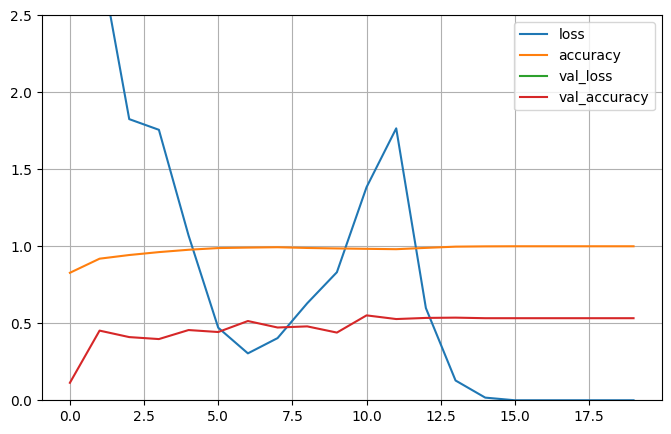

In [7]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 2.5)
plt.show()

the loss and accurcy during training is plotted. the graph flattens off at the end near 100%

# Save model

Save the model for later usage

In [8]:
model.save('Ass2C')
model = tf.keras.models.load_model('Ass2C')

INFO:tensorflow:Assets written to: Ass2C\assets


INFO:tensorflow:Assets written to: Ass2C\assets


# Evaluate Final Model

After training and saving the model you can deploy this model on any given input image. You can start a new application in where you import this model and apply it on any given imput images, so you can just load the model and don't need the timeconsuming training anymore.

69/69 [==============================] - 6s 86ms/step


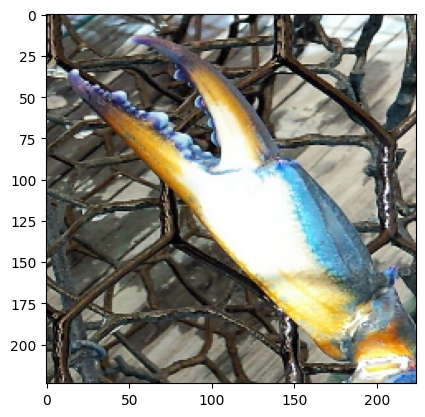

prediction = crab


In [11]:
predictions = model.predict([new_X_img])

plt.imshow(new_X_img[2], cmap=plt.cm.binary)
plt.show()
print("prediction =", CATEGORIES[np.argmax(predictions[2])])


Here we predict one image to double check the model. this image is out of the test data. The model classifies the image as crab. as seen by the image this is correct.

# Make Prediction

We can use our saved model to make a prediction on new images that are not trained on... make sure the input images receive the same pre-processing as the images you trained on.

So fetch some images from the internet (similar classes, but not from your dataset), prepare them to fit your network and classify them. Do this for  **10 images per class** and show the results!

* How good is the detection on you real dataset? (show some statistics) 

In [16]:
img_size = 224
X_img = []
Y_class = []
#test_data = []

#felix
#DATADIR = "C:/Users/felix/Office 365 Fontys/AIS zooi - General/Ass2C/pictures/test"
#Yosha
#DATADIR = "C:/Users/yosha19/OneDrive - Office 365 Fontys/General/Ass2C/pictures/test"
#kasper
DATADIR = "C:/Users/mobie/OneDrive - Office 365 Fontys/General - AIS zooi/Ass2C/pictures/test"

def create_test_data():
    for category in CATEGORIES: 

        path = os.path.join(DATADIR,category)  
        class_num = CATEGORIES.index(category)  

        for img in tqdm(os.listdir(path)):
            try:
                img_arrayBGR = cv2.imread(os.path.join(path,img))  # convert to array
                preprocessed_array = cv2.resize(img_arrayBGR, (img_size, img_size))  # resize to normalize data size
                preprocessed_array = np.expand_dims(preprocessed_array, axis=0)
                X_img.append(preprocessed_array)  # add img to array
                Y_class.append(class_num)     # add class to array
            except Exception as e:  # in the interest in keeping the output clean...
                print("Resizing not possible")
                plt.imshow(img_arrayBGR[...,::-1])  
                plt.show()
                
create_test_data()

#array to numpy array
X_img = np.asarray(X_img)
Y_class = np.asarray(Y_class)

#print(X_img, Y_class)
print("IMG shape = ",X_img.shape)
print("Class shape=",Y_class.shape)

#delete 1 object from array
new_X_img = X_img[:,0,:,:]

# create a new array with 360 rows and 6 columns, filled with zeros
new_Y_class = np.zeros((60, 6))  
# copy the values from Y_class into new_Y_class
for i in range(len(Y_class)):
    new_Y_class[i, Y_class[i]] = 1


print("IMG shape = ",new_X_img.shape)
print("Class shape=",new_Y_class.shape)
print(new_X_img)
print(new_Y_class)


100%|██████████| 10/10 [00:00<00:00, 213.35it/s]

IMG shape =  (60, 1, 224, 224, 3)
Class shape= (60,)
IMG shape =  (60, 224, 224, 3)
Class shape= (60, 6)
[[[[171 175 176]
   [171 175 176]
   [171 175 176]
   ...
   [210 212 212]
   [210 212 212]
   [210 212 212]]

  [[171 175 176]
   [171 175 176]
   [171 176 177]
   ...
   [210 212 212]
   [210 212 212]
   [210 212 212]]

  [[172 176 177]
   [172 176 177]
   [172 176 177]
   ...
   [211 213 213]
   [211 213 213]
   [211 213 213]]

  ...

  [[149 141  87]
   [114 108  51]
   [ 88  87  26]
   ...
   [224 226 226]
   [224 226 226]
   [224 226 226]]

  [[157 146  94]
   [144 138  82]
   [131 131  71]
   ...
   [224 226 226]
   [224 226 226]
   [224 226 226]]

  [[189 178 126]
   [206 200 144]
   [198 199 139]
   ...
   [224 226 226]
   [224 226 226]
   [224 226 226]]]


 [[[131 160 166]
   [ 72 103 112]
   [ 71 106 121]
   ...
   [146 158 155]
   [146 167 164]
   [181 203 201]]

  [[131 160 165]
   [ 73 104 113]
   [ 74 109 124]
   ...
   [148 161 159]
   [148 168 167]
   [178 199 199]]

Here we import our own test data set. A for loop iterates trough all images and resizes them and adds them to an array.

0
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


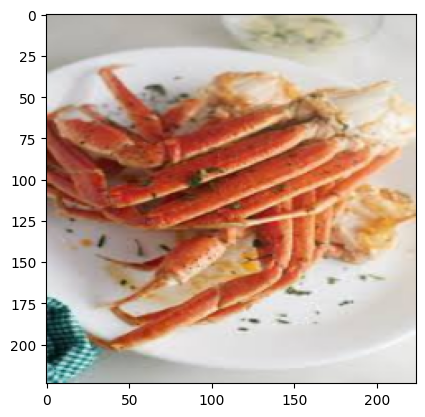

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


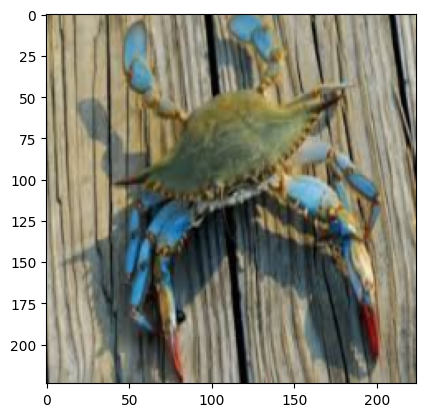

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


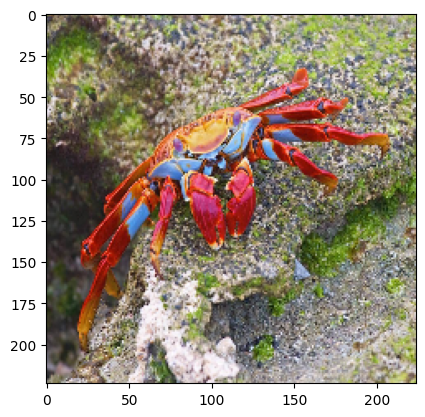

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


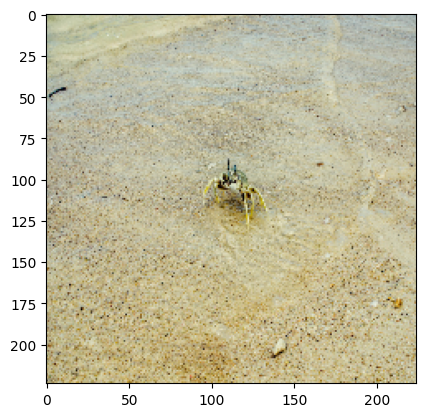

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


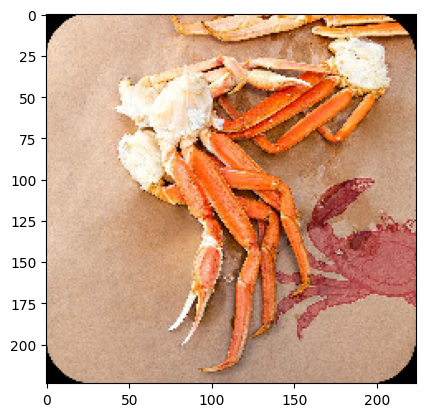

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


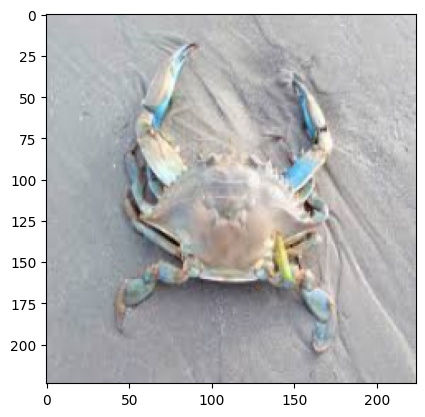

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


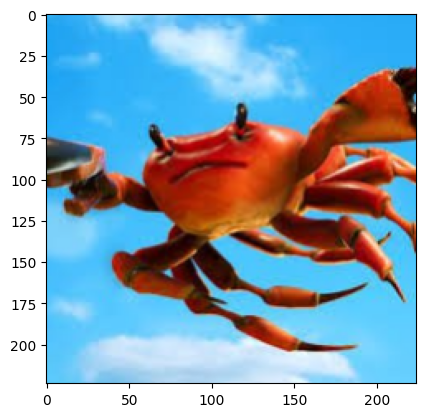

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


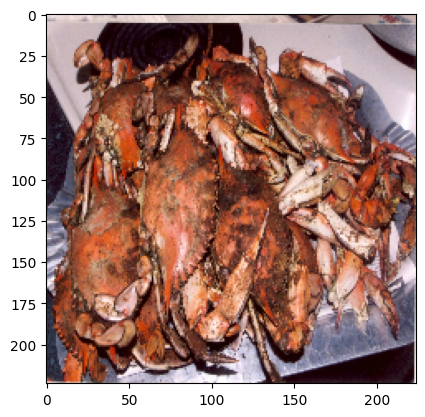

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


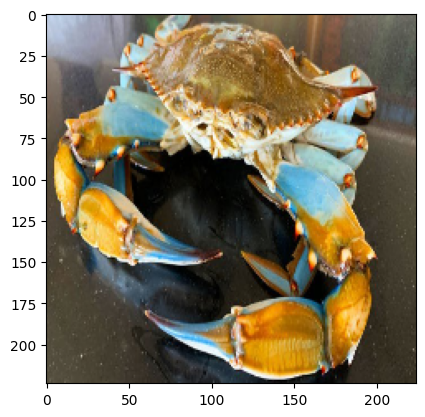

predict = crab
goed
0
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


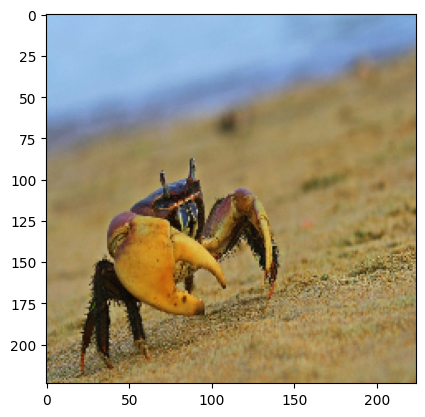

predict = crab
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


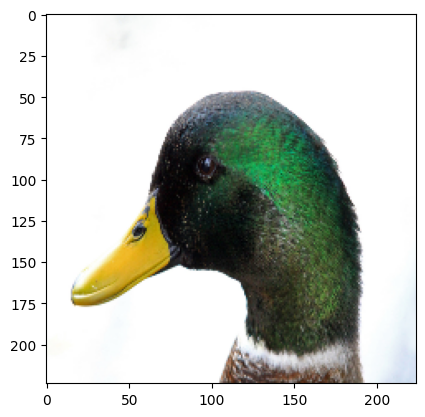

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


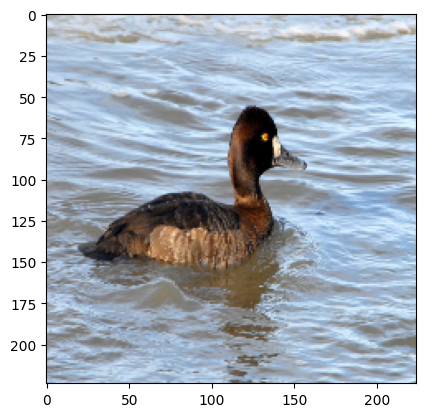

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 21ms/step


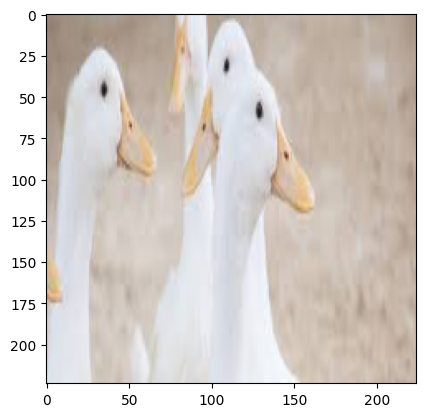

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


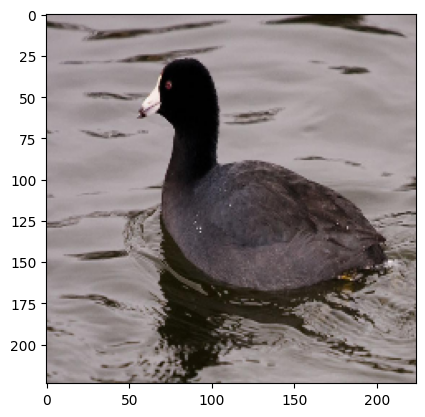

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 27ms/step


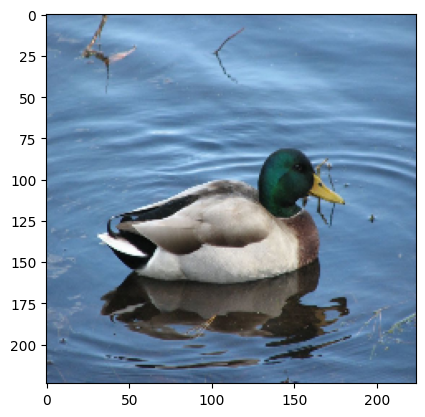

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


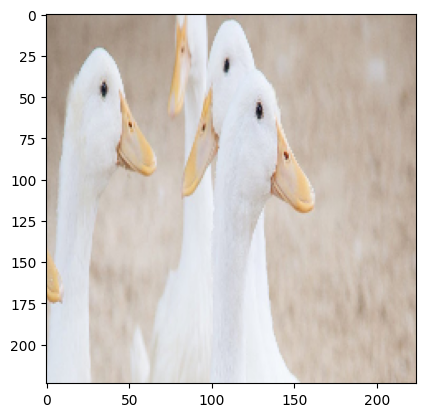

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


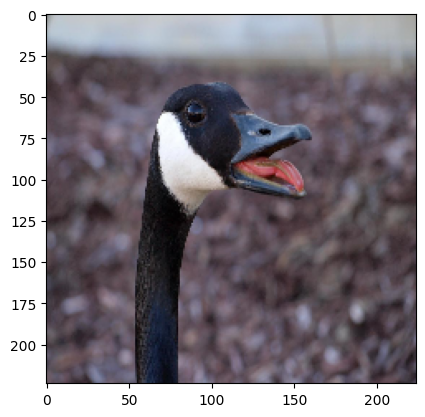

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 29ms/step


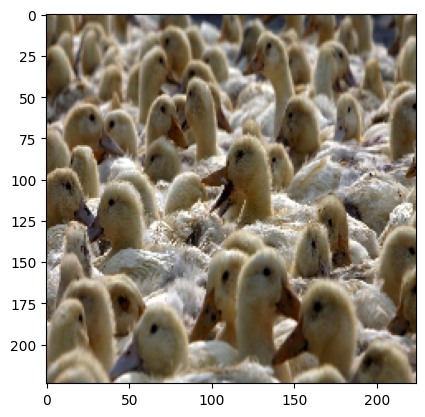

predict = duck
goed
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


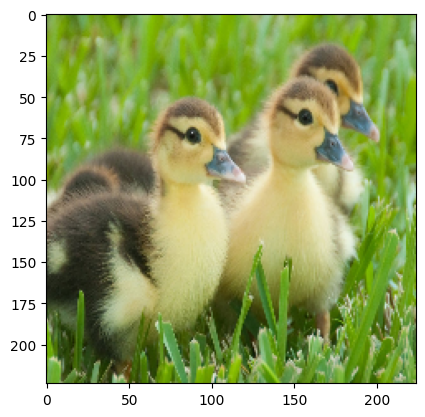

predict = panda
fout
1
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


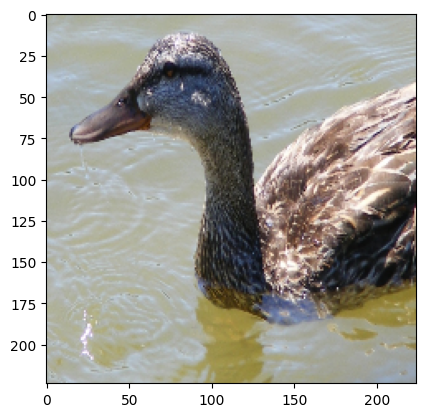

predict = duck
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


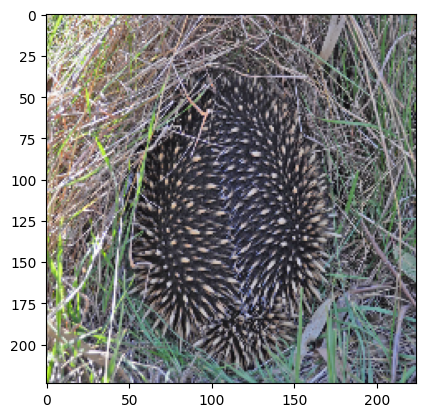

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


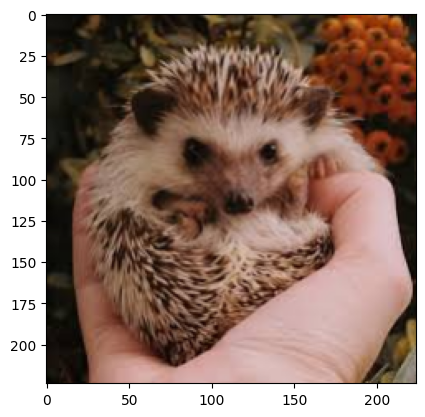

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


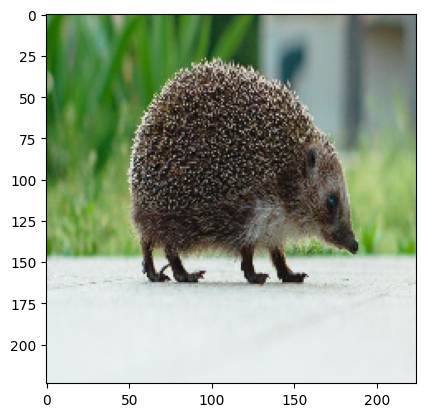

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


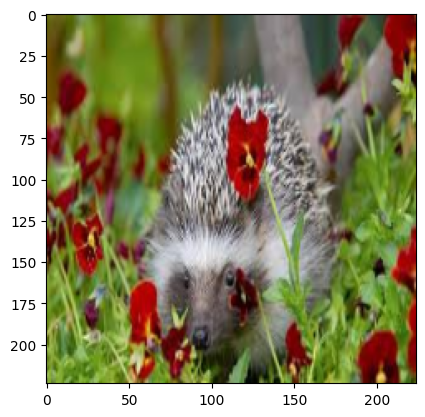

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


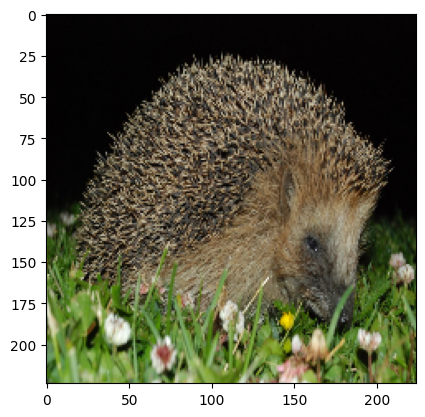

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


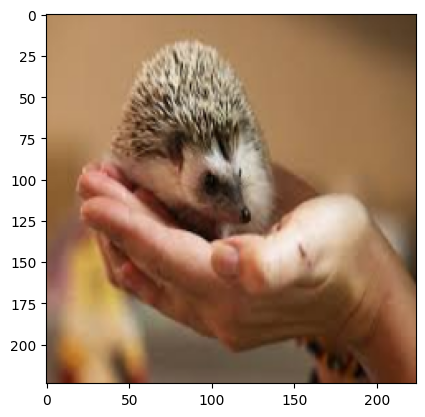

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 29ms/step


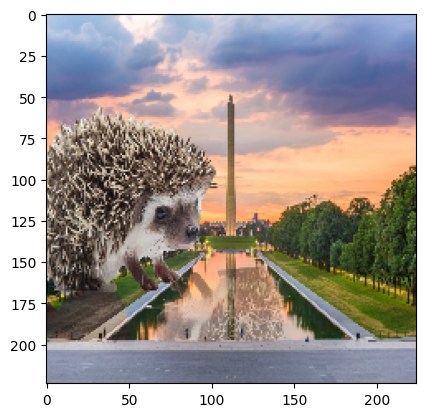

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


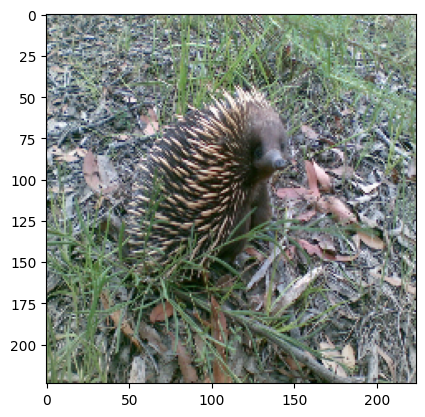

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


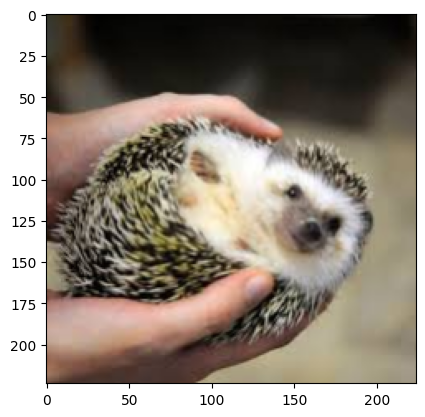

predict = hedgehog
goed
2
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


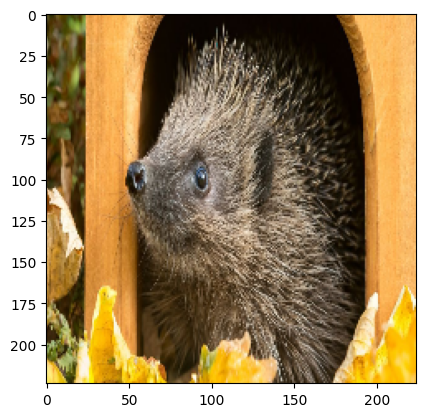

predict = hedgehog
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


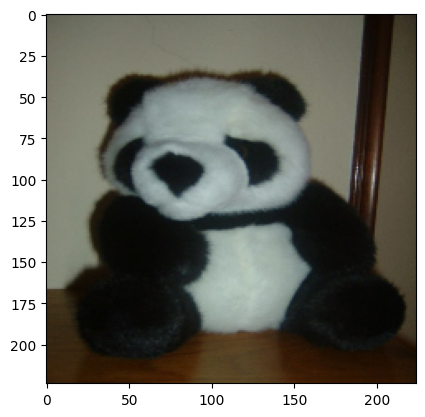

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


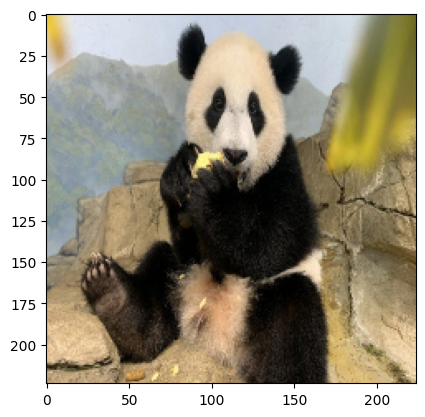

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


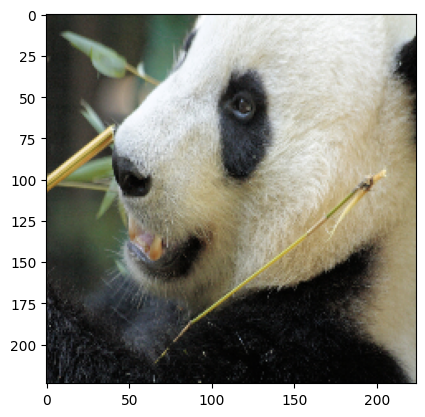

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 21ms/step


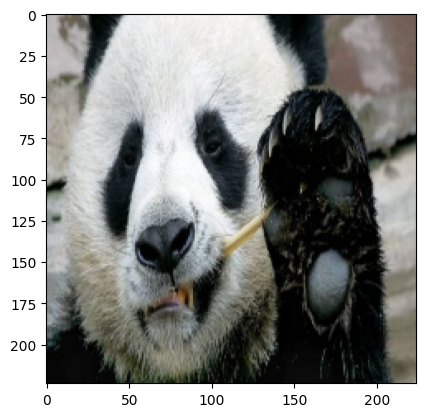

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


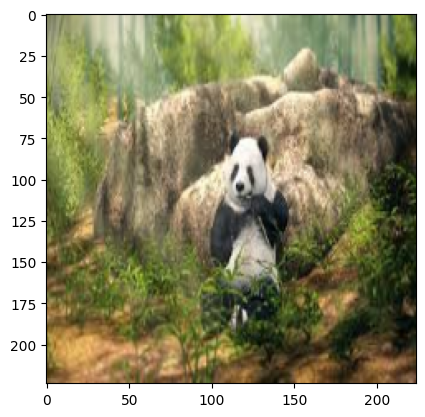

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


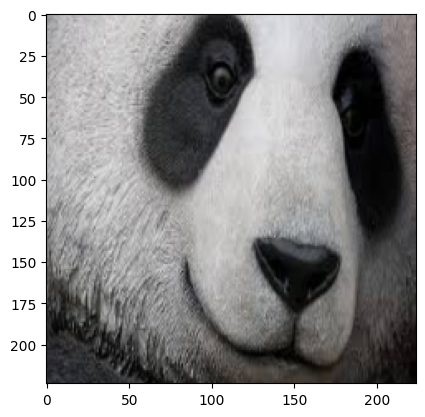

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


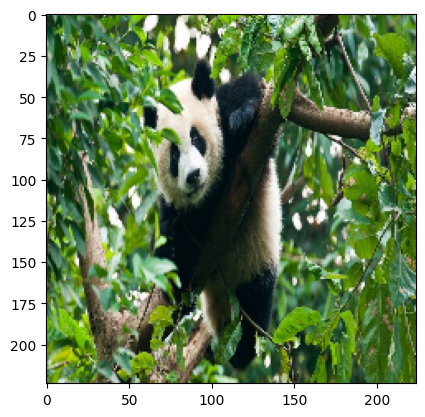

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


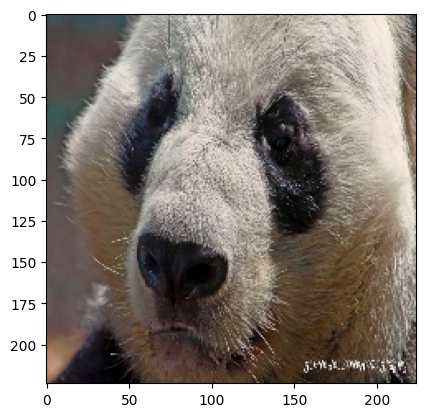

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


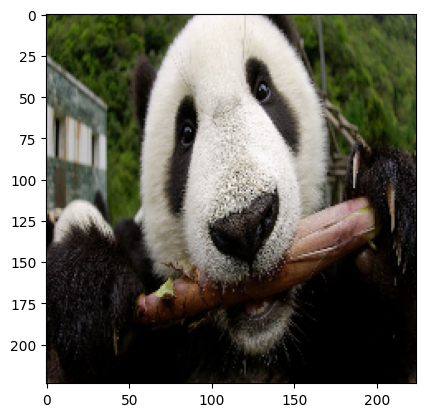

predict = panda
goed
3
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


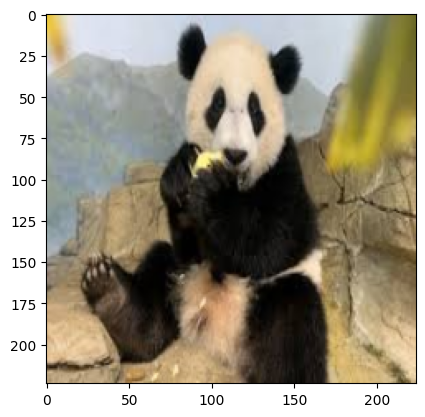

predict = panda
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


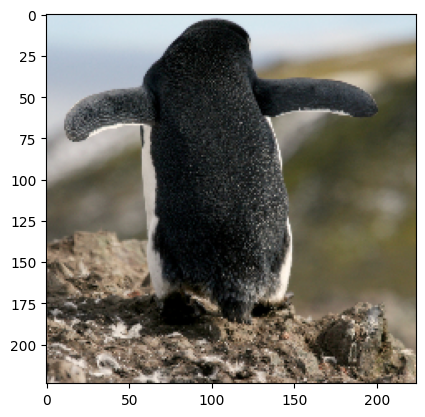

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 24ms/step


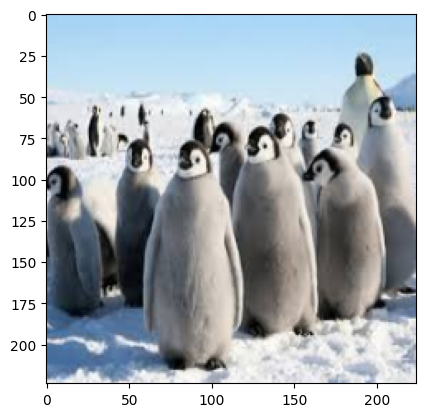

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


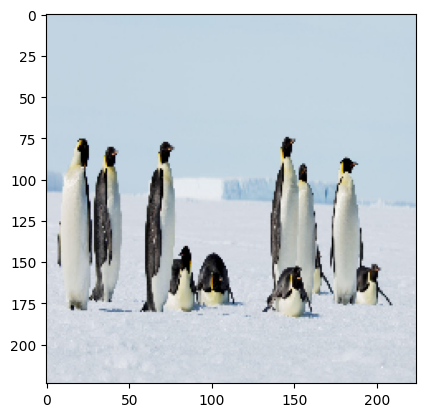

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


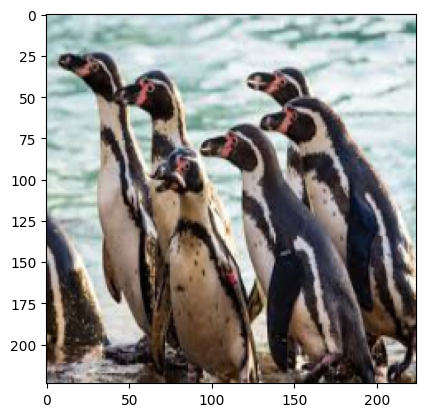

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


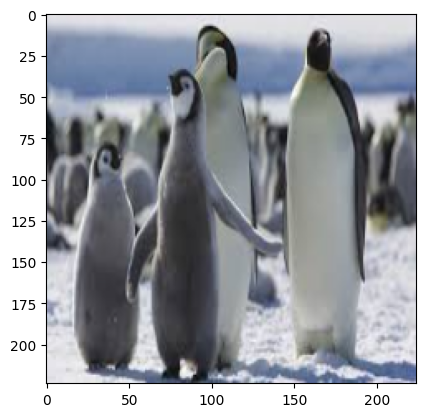

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 21ms/step


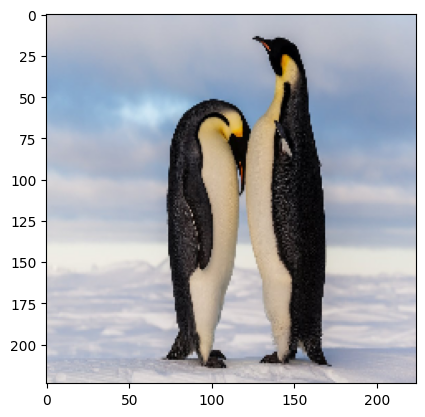

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


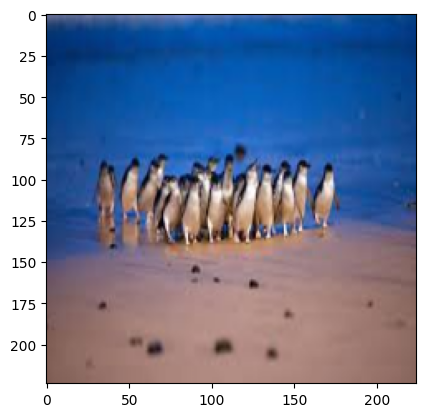

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


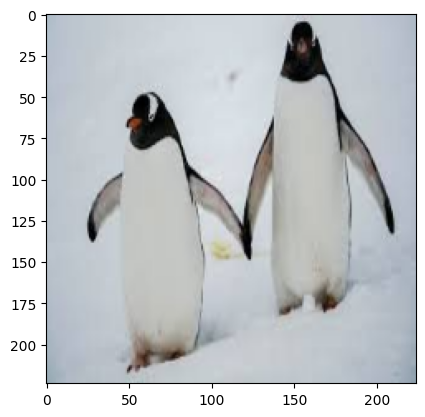

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


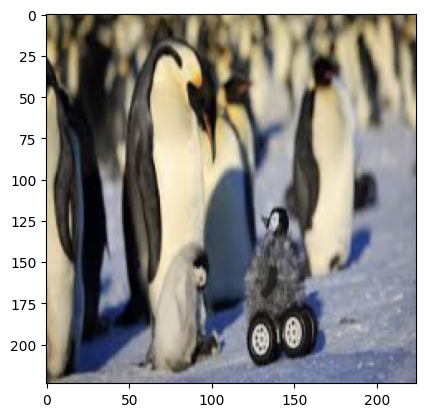

predict = penguin
goed
4
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


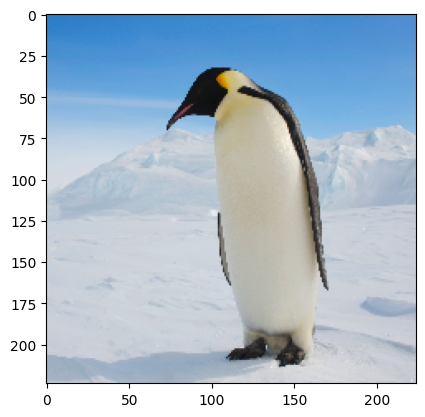

predict = penguin
goed
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


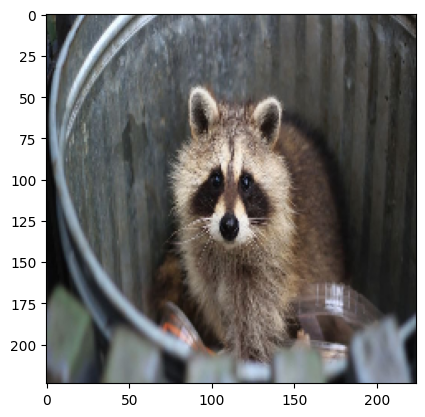

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


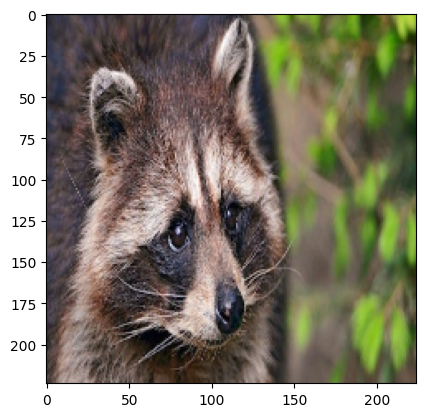

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


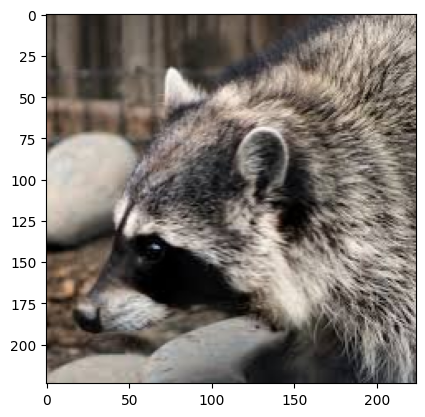

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 21ms/step


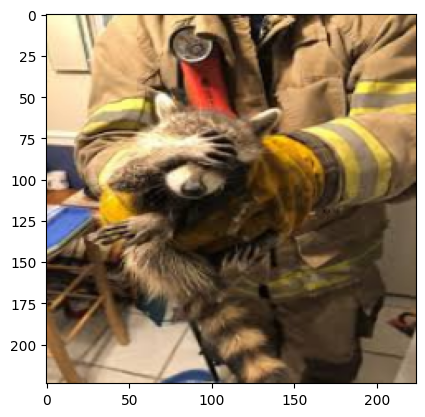

predict = crab
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


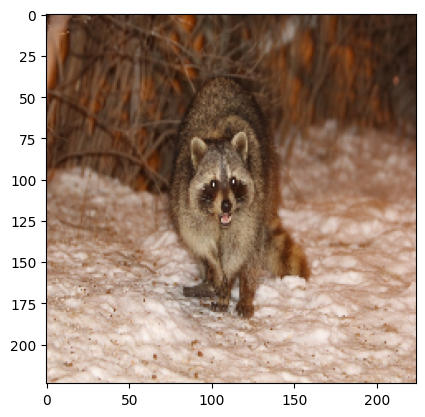

predict = panda
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


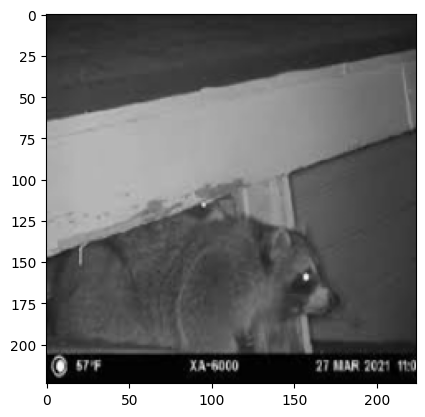

predict = duck
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step


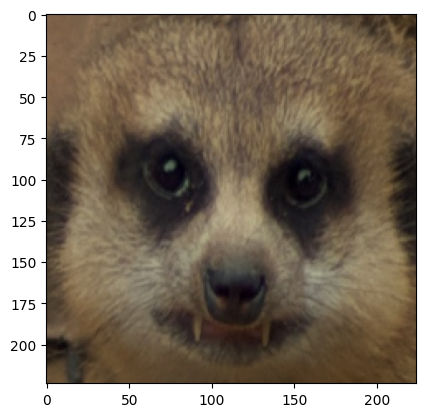

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 25ms/step


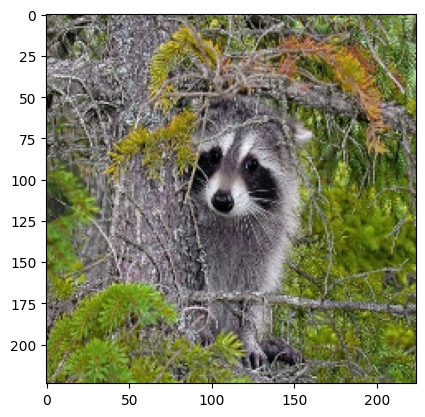

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 26ms/step


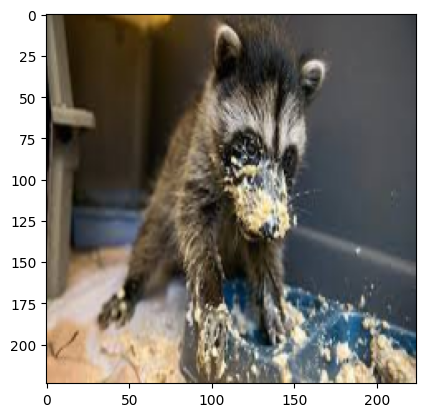

predict = hedgehog
fout
5
(1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step


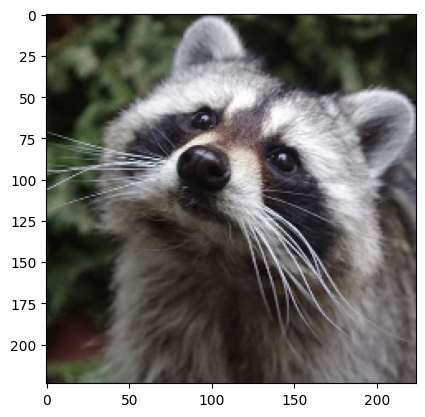

predict = hedgehog
fout
totaal = 60
acc = 81.66666666666667 %


In [33]:
g=0
f=0

for x, y in zip(X_img, Y_class):
    print(y)
    #print(x.shape)
    #x = np.expand_dims(x, axis=0)
    print(x.shape)
    
    predictions = model.predict([x])
    x = x[0,:,:,:]
    plt.imshow(x [...,::-1])
    plt.show()
    
    print("predict =", CATEGORIES[np.argmax(predictions)])
    if (y==np.argmax(predictions)):
        g = g+1
        print("goed")
    else:
        f = f+1
        print("fout")

acc = g/(g+f)
tot = g + f
print("totaal =", tot)
print("acc =", acc*100,"%")

In this cell we iterate trough all the pictures and run them trough the model seperately. We also check if the guess was correct and calculated the accuracy of the model. 

# Additional Questions
1. Explain what your input object represents and how the result should be classified
2. Explain the pre-processing steps of the object training image(s) before you can feed it to the network.
3. What features do you think are extracted (relevant)?
4. Show (in report and video) how accurate your predicted model is, how does your detection behave in other unseen situations? Also explain in what situation and why it does (not) perform well. Supported your statements by measurement data!
5. Explain the parameters that you used for re-training this network?
6. This example uses a custom (but pre-trained) network architecture, explain how it works and why it is build up this way?

1.the imputs objects are animals wich should be classified in the correct species
2.the images are converted from BGR to RGB, resized to 224*224, processed to fit in an array of [...*1]. wich is then converted to a numpy array. this array then gets the same shape as the vgg16 model input by adding or removing columns.
3.colour and shape
4.our accuracy is 81.7%. mainly the raccoon and the hedgehog are similar
5.the vgg16 model is used as feature regignition, the added parameters will serve as image classification. it consists of 2 fully connected layers
6.the model consists of convolution layers followed by a pooling layer wich simplifies the output. this is done 5 times in the vgg16 model.

## Finetuning
Finetuning by retraining all weights in the network as described in the workflow is Optional, but this will lead to a better accuracy of your final model,

the accyracy is already decently high, retraining the entire model will not result in significantly higher accuracy. therefore it will be a waste of tima and recources